# ***Diabetes Patient Data Analysis and Prediction***
##### *To analyze the dataset of diabetes patients and build a machine learning model to predict whether a patient is diabetic or not based on various health-related features.*
***

## ***Objective:***
1. ***Perform Exploratory Data Analysis (EDA)*** to uncover patterns, correlations, and insights from the dataset. 
2. ***Prepare the data for machine learning*** by handling missing values, scaling, and splitting into training and test 
sets. 
3. ***Build and evaluate a classification model*** to predict the diabetes outcome based on health-related features. 
4. ***Use metrics*** like accuracy, recall, and F1-score to evaluate the model’s performance. 
5. **Generate visualizations** to help better understand feature distributions and model predictions.
---

## ***Dataset Overview:***
##### This dataset consists of `9 columns` that provide health and demographic information about patients. Here's a breakdown of each column:
1. `Pregnancies:`
   - Represents the number of times the patient has been pregnant.
   - Type: Integer
2. `Glucose:`
   - Plasma glucose concentration (measured after 2 hours in an oral glucose tolerance test).
   - Type: Float
   - Higher glucose levels may indicate poor insulin control.
3. `BloodPressure:`
   - Diastolic blood pressure (mm Hg).
   - Type: Float
   - Tracks heart health and blood circulation.
4. `SkinThickness:`
   - Triceps skinfold thickness (mm).
   - Type: Float
   - Acts as an indirect measure of body fat.
5. `Insulin:`
   - 2-hour serum insulin (mu U/ml).
   - Type: Float
   - Measures insulin function and glucose metabolism.
6. `BMI:`
   - Body mass index (weight in kg/(height in m)^2).
   - Type: Float
   - Used to measure body fat and overall health.
7. `DiabetesPedigreeFunction:`
   - A function that assesses the likelihood of diabetes based on family history.
   - Type: Float
   - This is a probabilistic value derived from genetic factors.
8. `Age:`
   - Age of the patient (years).
   - Type: Integer
   - Age can be a significant factor in diabetes onset.
9. `Outcome:`
   - Target variable indicating whether the patient has diabetes (1) or not (0).
   - Type: Integer (Binary Classification)
---

## ***Import Libraries:***

In [81]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from imblearn.over_sampling import SMOTE

from sklearn.preprocessing import StandardScaler, LabelEncoder, OneHotEncoder
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV

from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline 

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier

from sklearn.model_selection import GridSearchCV

from sklearn.metrics import accuracy_score, f1_score, recall_score
import warnings as w
w.filterwarnings('ignore')


## ***Load and inspect the dataset:***

In [2]:

data = pd.read_csv('dibetiese.csv')
data.head()


,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [3]:

display(data.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


None

In [4]:

print(f"The dataset has {data.shape[0]} rows, and {data.shape[1]} columns.")


The dataset has 768 rows, and 9 columns.


In [5]:

missing_values = data.isnull().sum().sum()

if missing_values > 0:
    display(data.isnull().sum())
else:
    print(f"Tha dataset has {missing_values} missing values.")


Tha dataset has 0 missing values.


In [6]:

duplicate_values = data.duplicated().sum()
print(f"Tha dataset has {duplicate_values} duplicate values.")


Tha dataset has 0 duplicate values.


In [7]:

display(data.describe())


,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


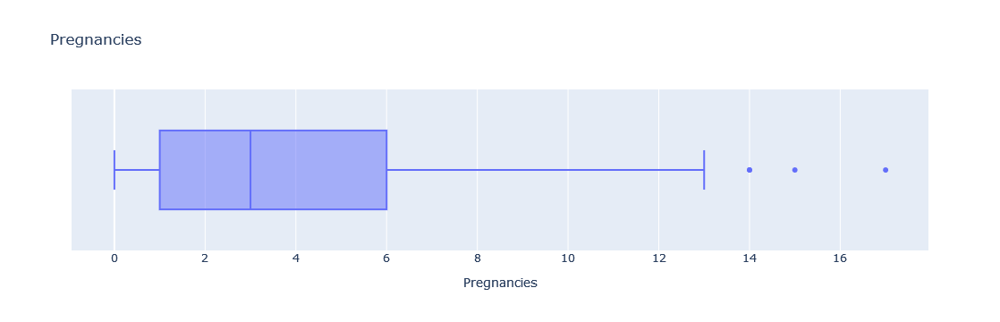

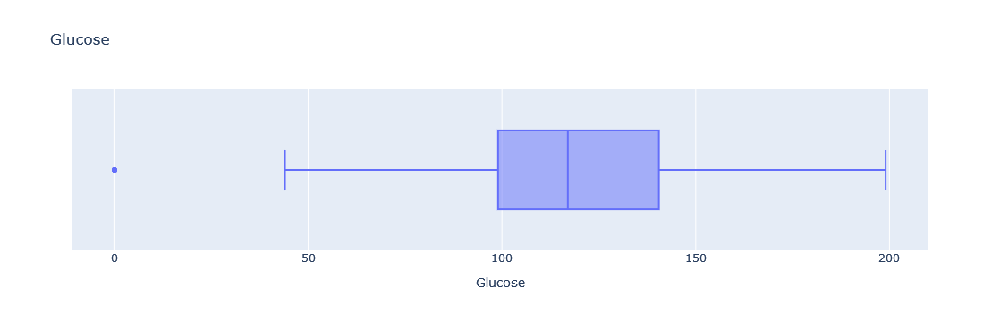

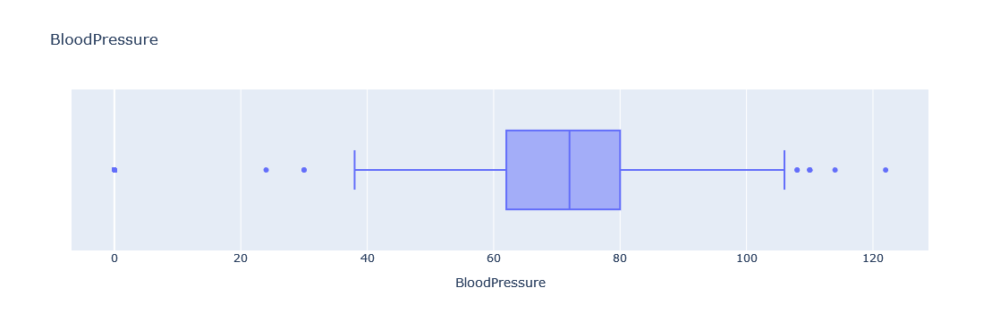

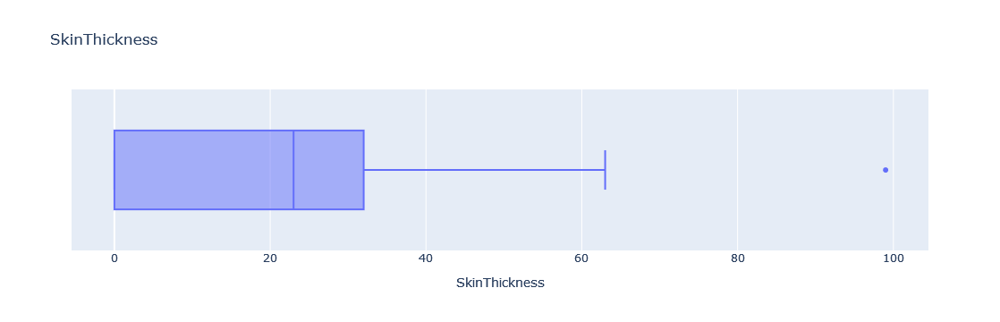

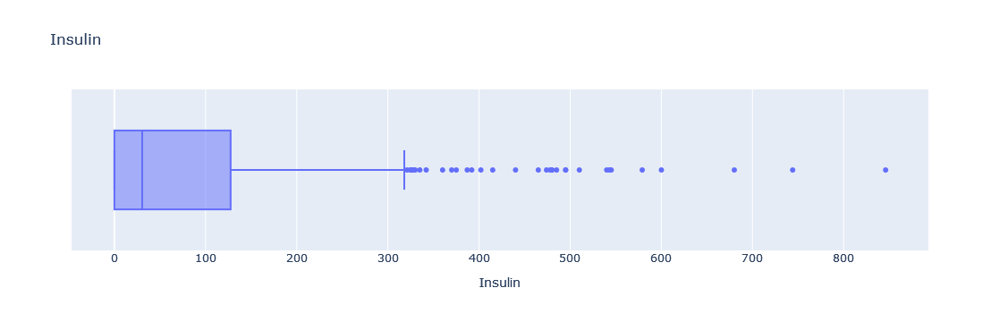

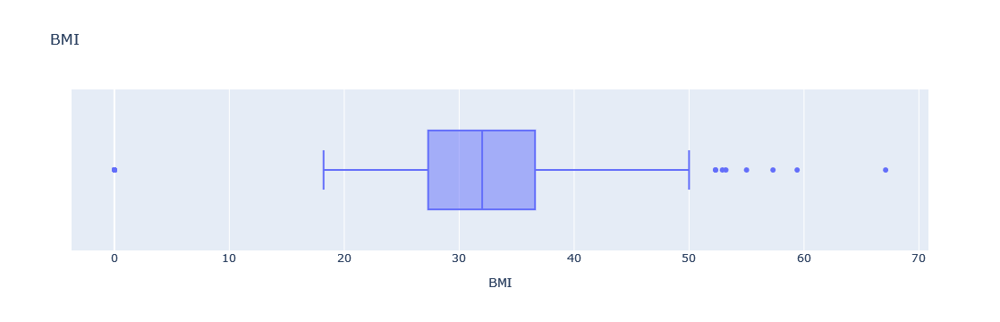

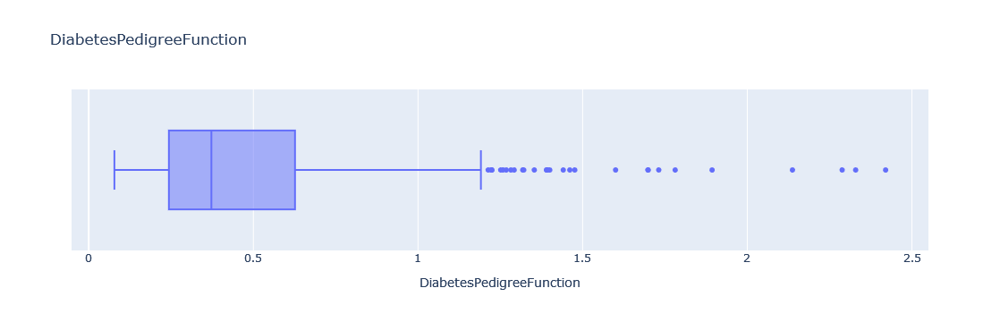

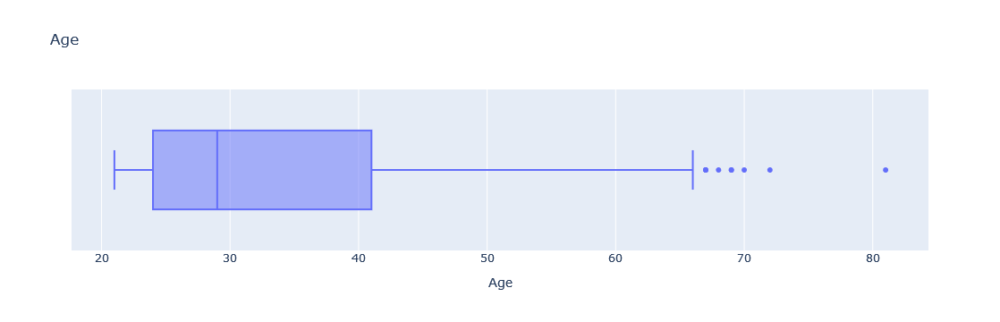

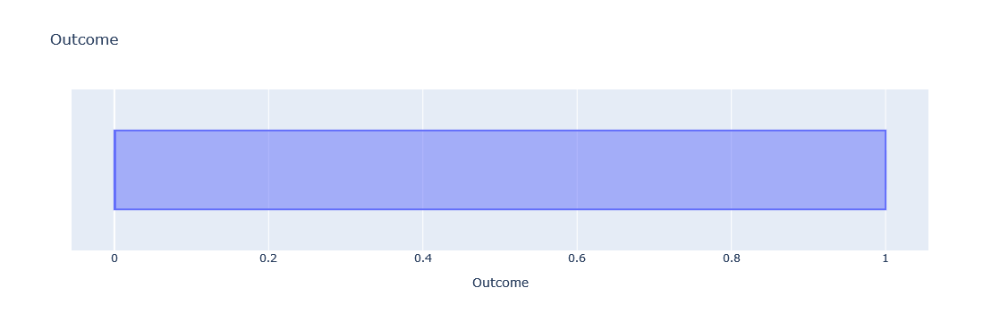

In [8]:

for i in data.columns:
    fig = px.box(x = data[i], title=f"{i}")
    fig.update_layout(xaxis_title = f'{i}')
    fig.show()
    

In [9]:

def outlier(data, col):
    Q1 = data[col].quantile(0.25)
    Q3 = data[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outlier_ = data[(data[col] < lower_bound) | (data[col] > upper_bound)]
    return len(outlier_)


In [10]:

outliers_ = {}
for i in data.select_dtypes(exclude=['object']):
    outliers = outlier(data, i)
    outliers_[i] = outliers

outliers = pd.DataFrame(outliers_, index=[0])
outliers


,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,4,5,45,1,34,19,29,9,0


## ***Outlier Handling***

In [11]:

def capping_outliers_with_nan(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    df[column] = np.where((df[column] < lower_bound) | (df[column] > upper_bound), np.nan, df[column])

for column in data.select_dtypes(exclude='object'):
    capping_outliers_with_nan(data, column)

display(data.head())


,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6.0,148.0,72.0,35.0,0.0,33.6,0.627,50.0,1.0
1,1.0,85.0,66.0,29.0,0.0,26.6,0.351,31.0,0.0
2,8.0,183.0,64.0,0.0,0.0,23.3,0.672,32.0,1.0
3,1.0,89.0,66.0,23.0,94.0,28.1,0.167,21.0,0.0
4,0.0,137.0,40.0,35.0,168.0,43.1,NaN,33.0,1.0


In [12]:

data.isnull().sum()


Pregnancies                  4
Glucose                      5
BloodPressure               45
SkinThickness                1
Insulin                     34
BMI                         19
DiabetesPedigreeFunction    29
Age                          9
Outcome                      0
dtype: int64

In [13]:

for i in data.columns:
    data[i] = data[i].fillna(data[i].median())
    

In [14]:

data.describe()


,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.782552,121.656250,72.196615,20.437500,59.569010,32.198958,0.427044,32.760417,0.348958
std,3.270644,30.438286,11.146723,15.698554,78.415321,6.410558,0.245323,11.055385,0.476951
min,0.000000,44.000000,38.000000,0.000000,0.000000,18.200000,0.078000,21.000000,0.000000
25%,1.000000,99.750000,64.000000,0.000000,0.000000,27.500000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,0.000000,32.000000,0.356000,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,110.000000,36.300000,0.582250,40.000000,1.000000
max,13.000000,199.000000,106.000000,63.000000,318.000000,50.000000,1.191000,66.000000,1.000000


In [15]:

data.isnull().sum()


Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

## ***EDA***

In [16]:
def classify_features(data):
    categorical_features = []
    non_categorical_features = []
    discrete_features = []
    continuous_features = []

    for column in data.columns:
        if data[column].dtype == 'object':
            if data[column].nunique() < 10:
                categorical_features.append(column)
            else:
                non_categorical_features.append(column)
        elif data[column].dtype in ['int64','float64']:
            if data[column].nunique() < 10:
                discrete_features.append(column)
            else:
                continuous_features.append(column)
    return categorical_features, non_categorical_features, discrete_features, continuous_features
    
categorical_features, non_categorical_features, discrete_features, continuous_features = classify_features(data)      
    

In [17]:

print(f"Categorical Features: {len(categorical_features)}")


Categorical Features: 0


In [18]:

print(f"Non Categorical Features: {len(non_categorical_features)}")


Non Categorical Features: 0


In [19]:

print(f"Discrete Features: {len(discrete_features)}")
print(discrete_features)


Discrete Features: 1
['Outcome']


In [20]:

print(f"Continuous Features: {len(continuous_features)}")
print(continuous_features)


Continuous Features: 8
['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']


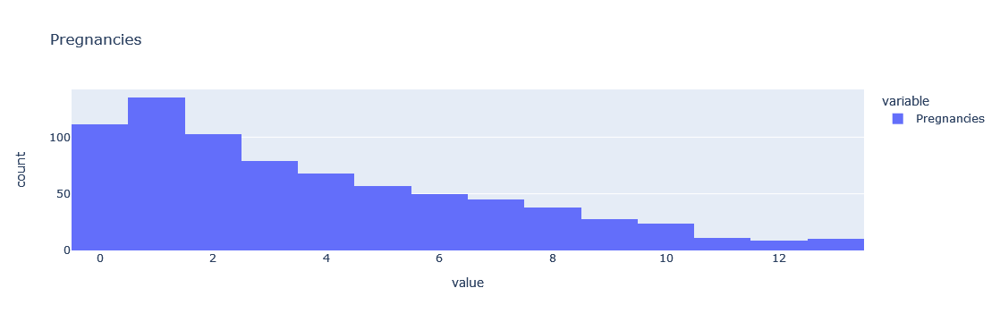

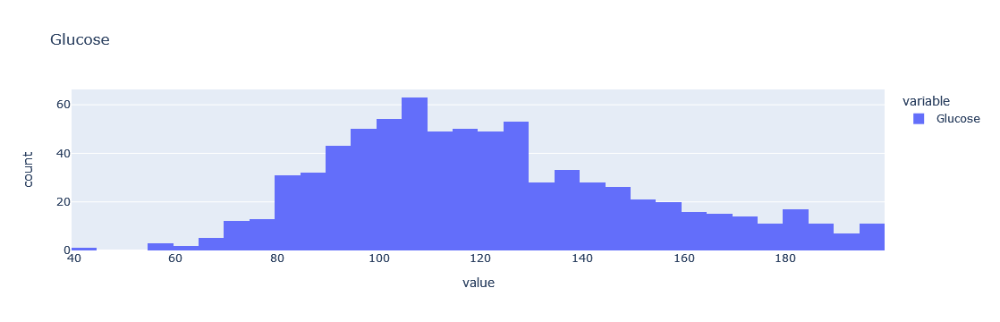

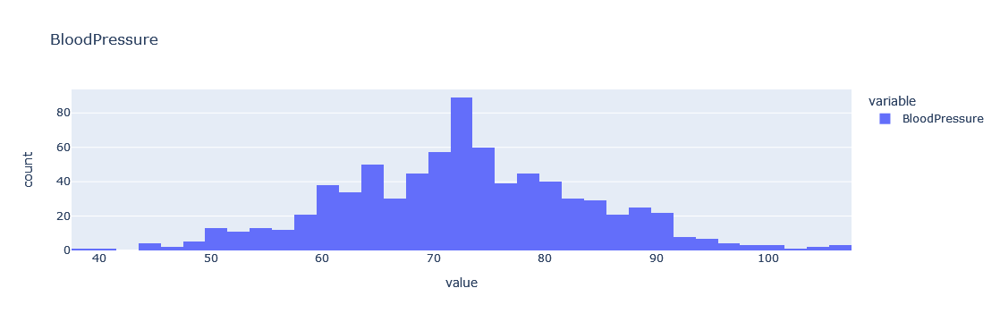

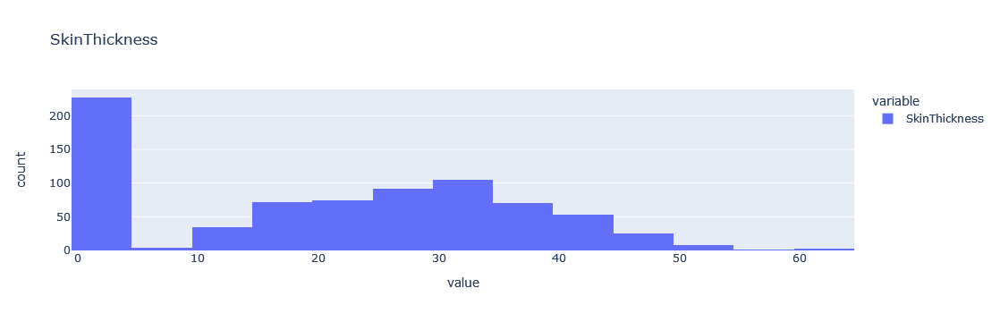

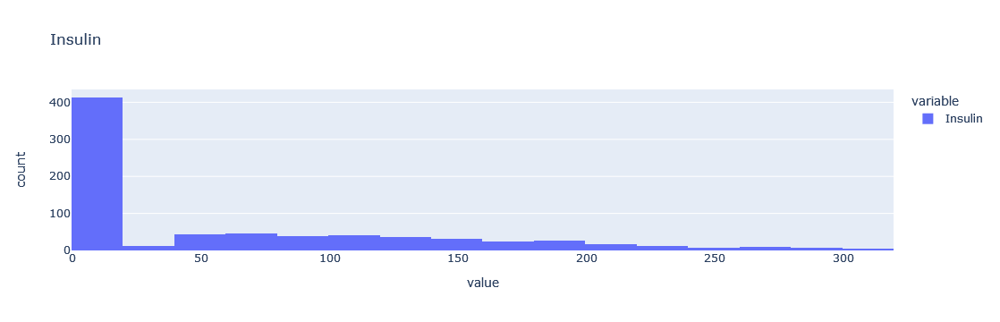

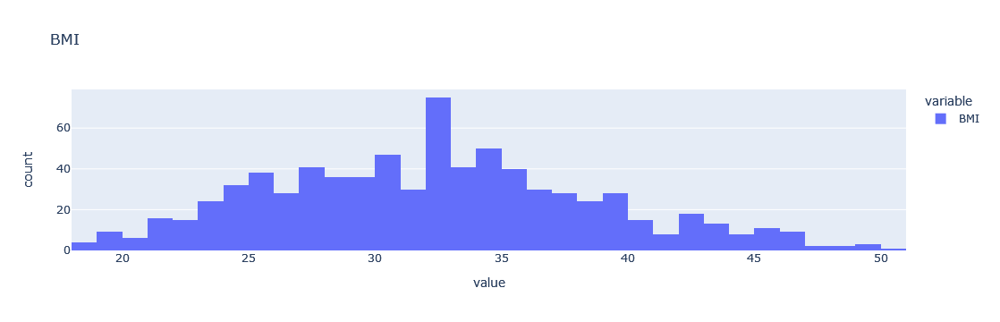

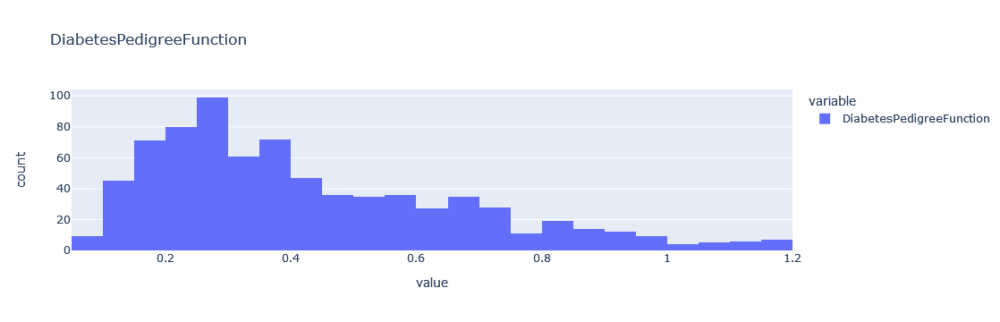

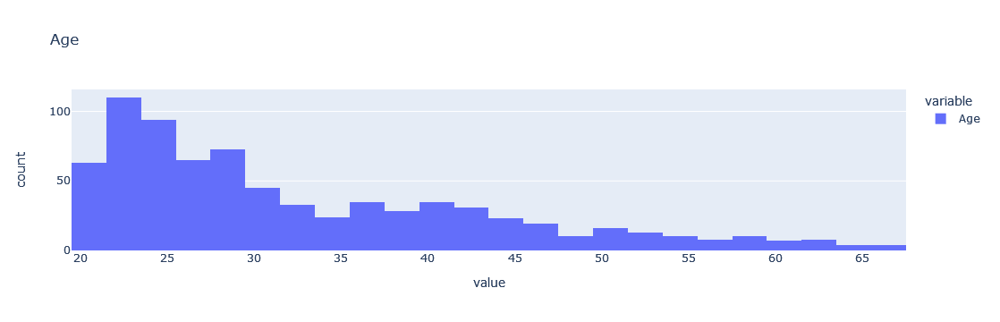

In [21]:

for i in continuous_features:
    fig = px.histogram(data[i], title=f"{i}",)
    fig.show()
    

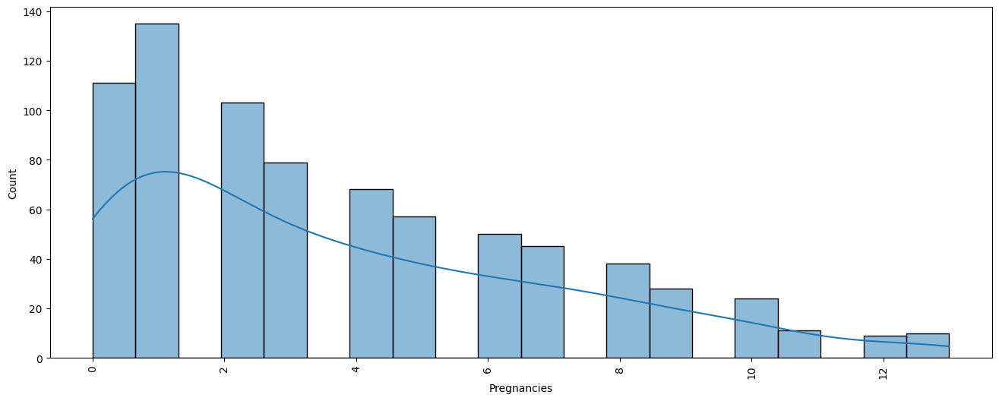

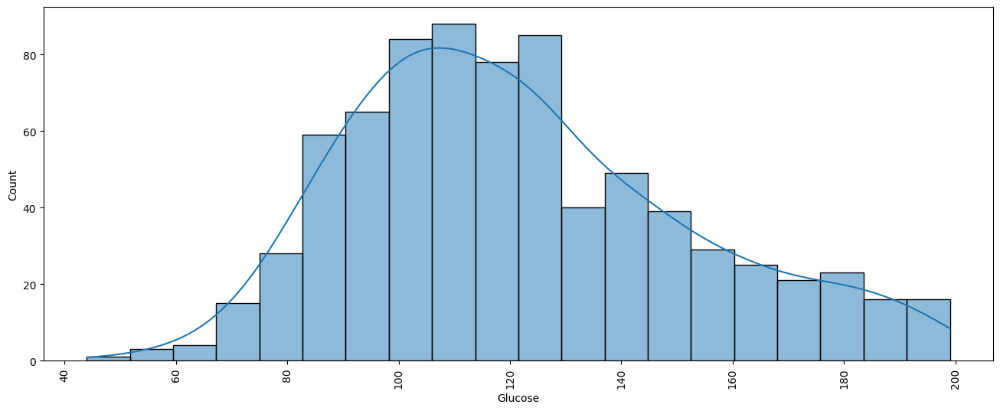

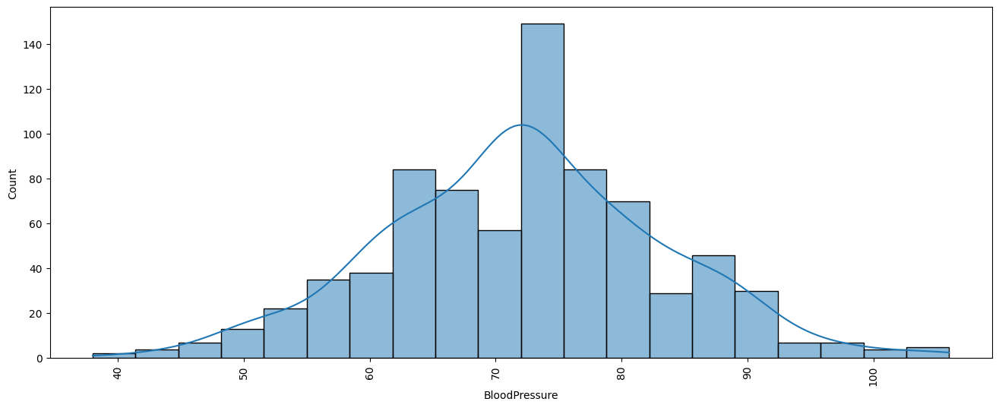

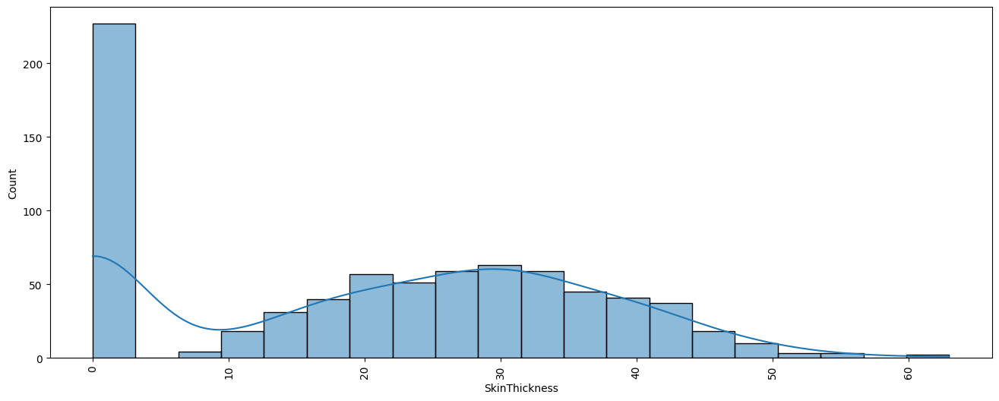

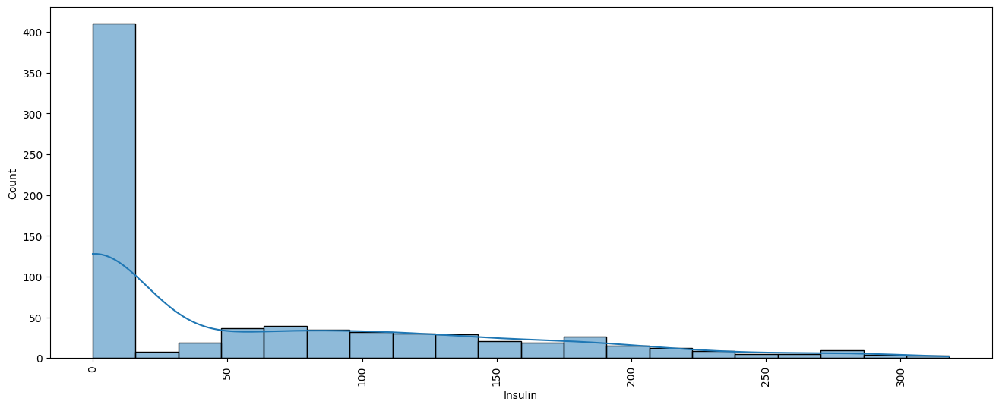

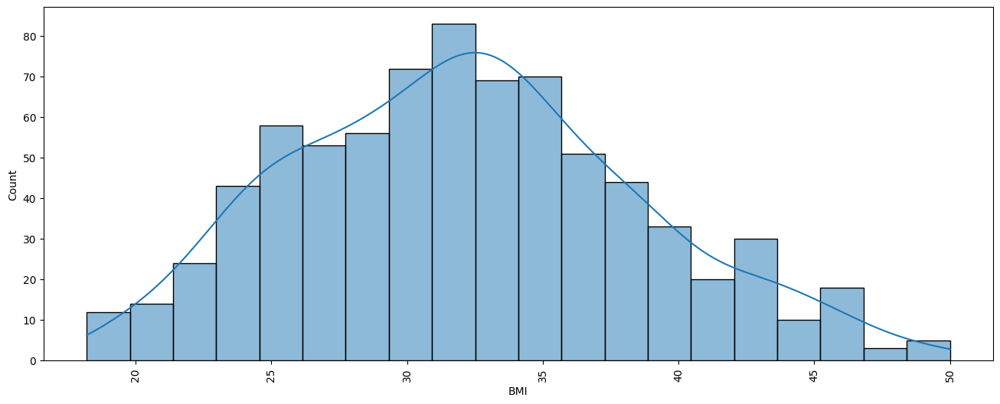

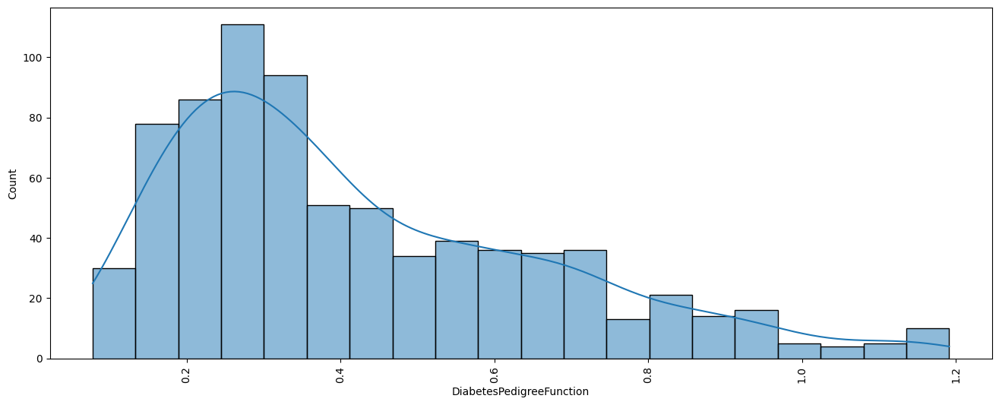

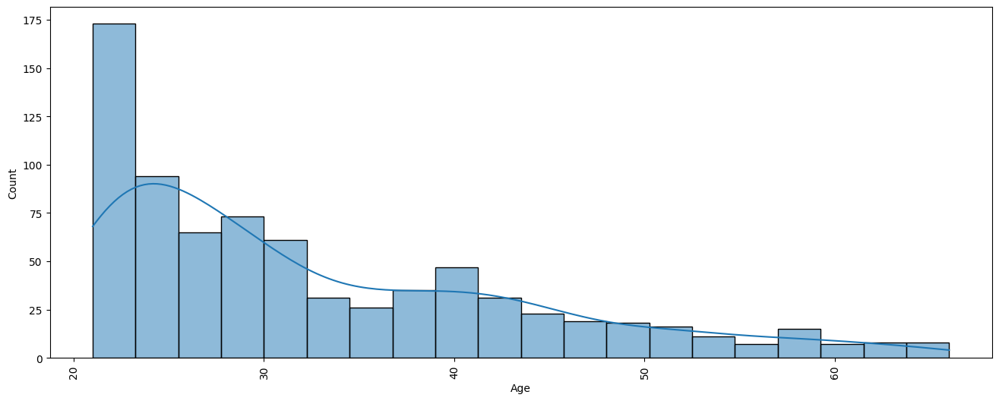

In [22]:

for i in continuous_features:
    plt.figure(figsize=(16,6))
    sns.histplot(data[i], bins = 20, kde = True, palette ='hls')
    plt.xticks(rotation = 90)
    plt.show()
    

In [123]:

for i in continuous_features:
    print(i)
    value_counts = data[i].value_counts().reset_index()
    value_counts = pd.DataFrame(value_counts)
    display(value_counts)
    print()
    

Pregnancies


,Pregnancies,count
0,1.0,135
1,0.0,111
2,2.0,103
3,3.0,79
4,4.0,68
5,5.0,57
6,6.0,50
7,7.0,45
8,8.0,38
9,9.0,28



Glucose


,Glucose,count
0,99.0,17
1,100.0,17
2,117.0,16
3,129.0,14
4,125.0,14
...,...,...
130,191.0,1
131,177.0,1
132,44.0,1
133,62.0,1



BloodPressure


,BloodPressure,count
0,72.0,89
1,70.0,57
2,74.0,52
3,78.0,45
4,68.0,45
5,64.0,43
6,80.0,40
7,76.0,39
8,60.0,37
9,62.0,34



SkinThickness


,SkinThickness,count
0,0.0,227
1,32.0,31
2,30.0,27
3,23.0,23
4,27.0,23
5,33.0,20
6,28.0,20
7,18.0,20
8,31.0,19
9,19.0,18



Insulin


,Insulin,count
0,0.0,408
1,105.0,11
2,130.0,9
3,140.0,9
4,120.0,8
...,...,...
151,68.0,1
152,29.0,1
153,42.0,1
154,184.0,1



BMI


,BMI,count
0,32.0,32
1,31.6,12
2,31.2,12
3,32.4,10
4,33.3,10
...,...,...
235,30.7,1
236,22.7,1
237,45.4,1
238,42.0,1



DiabetesPedigreeFunction


,DiabetesPedigreeFunction,count
0,0.356,31
1,0.254,6
2,0.258,6
3,0.238,5
4,0.268,5
...,...,...
484,0.997,1
485,0.226,1
486,0.612,1
487,0.655,1



Age


,Age,count
0,22.0,72
1,21.0,63
2,25.0,48
3,24.0,46
4,29.0,38
5,23.0,38
6,28.0,35
7,26.0,33
8,27.0,32
9,31.0,24


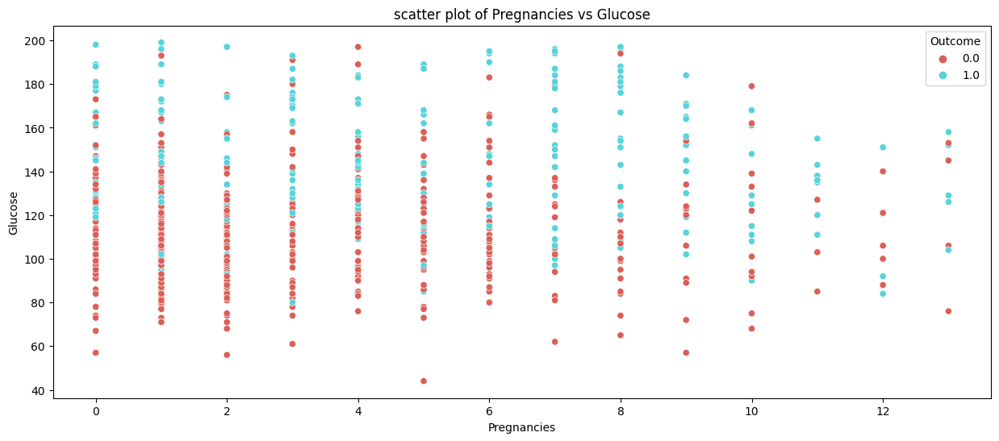

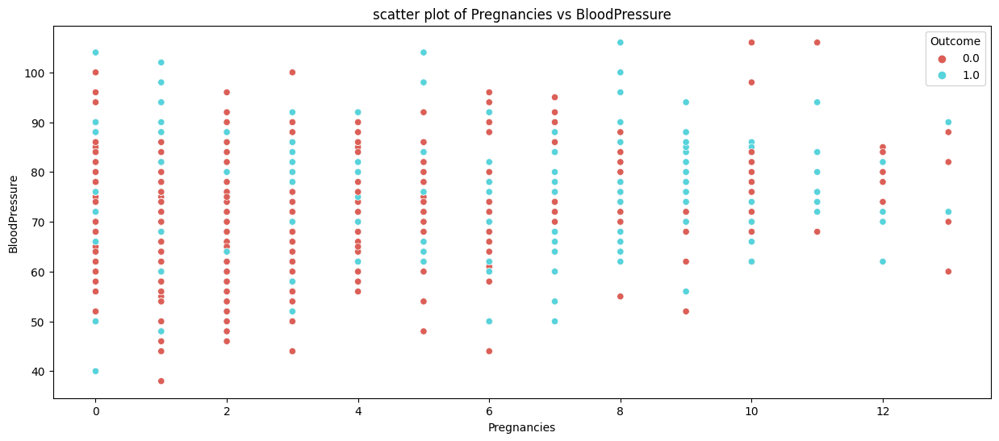

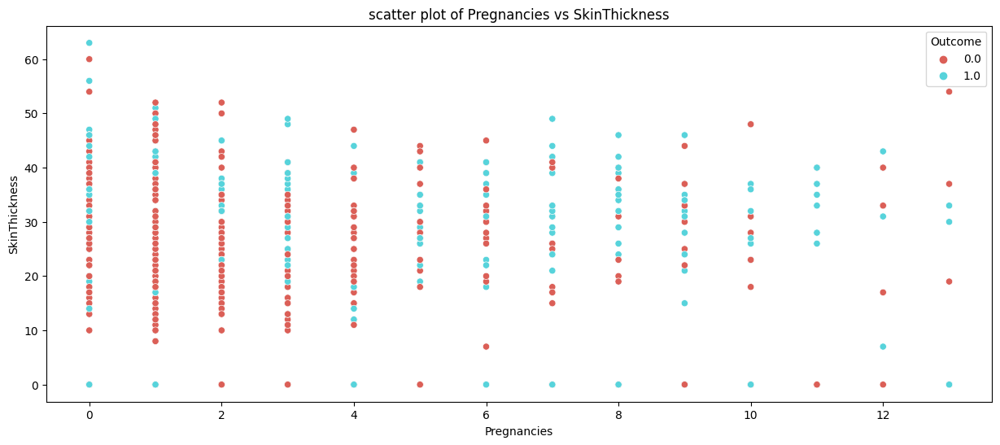

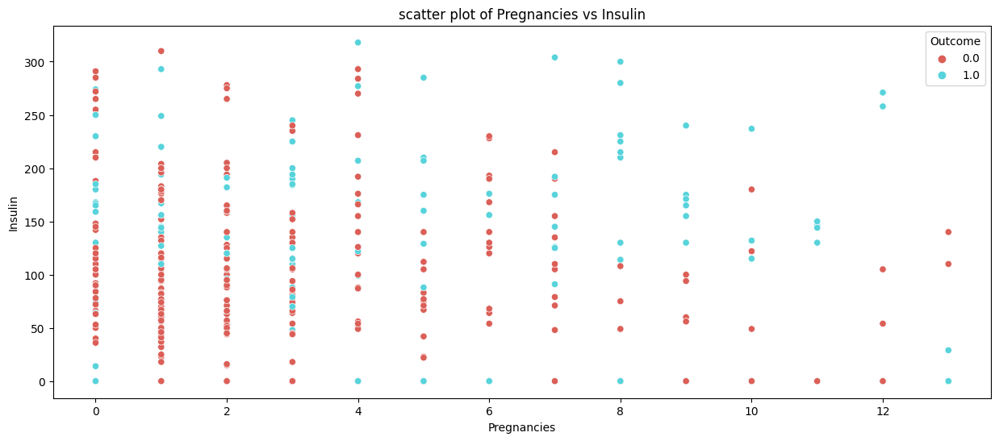

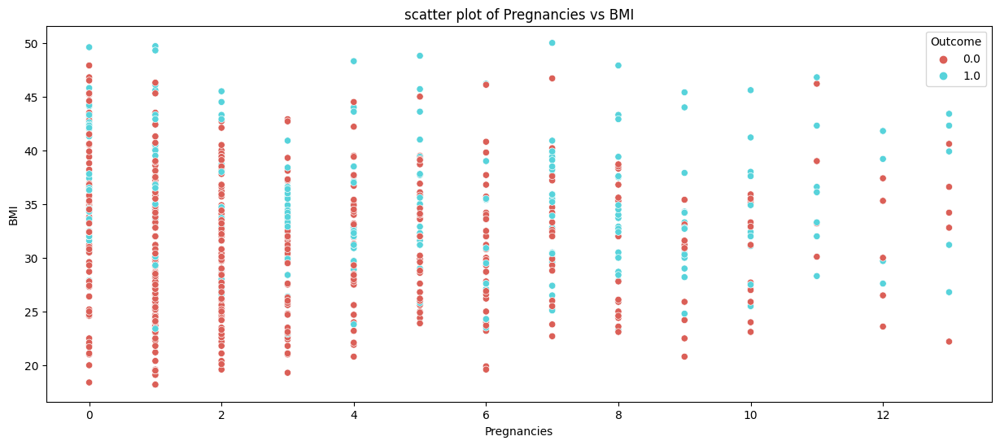

...

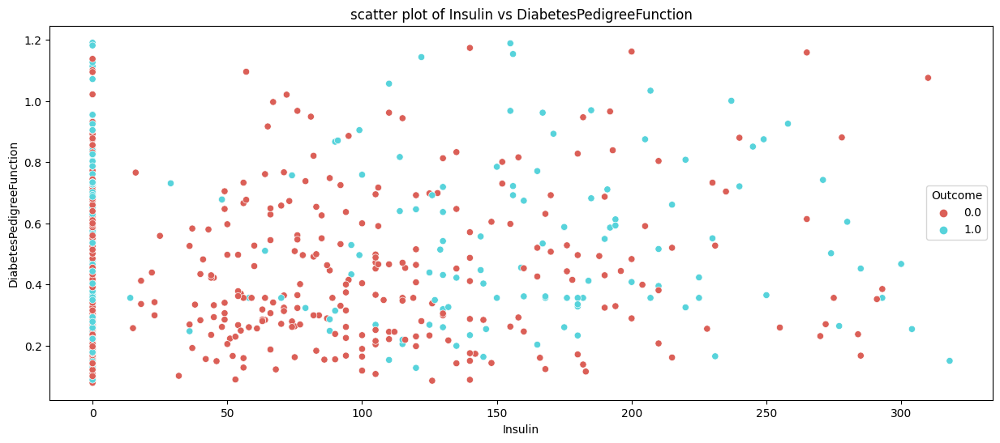

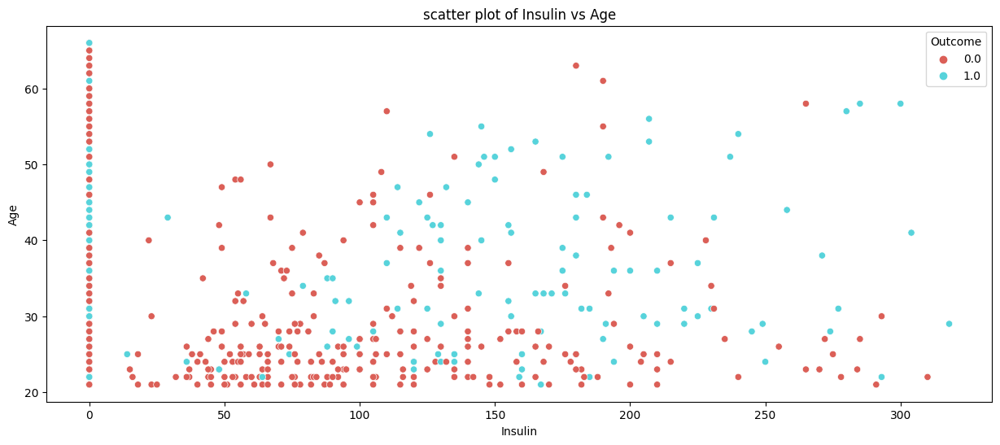

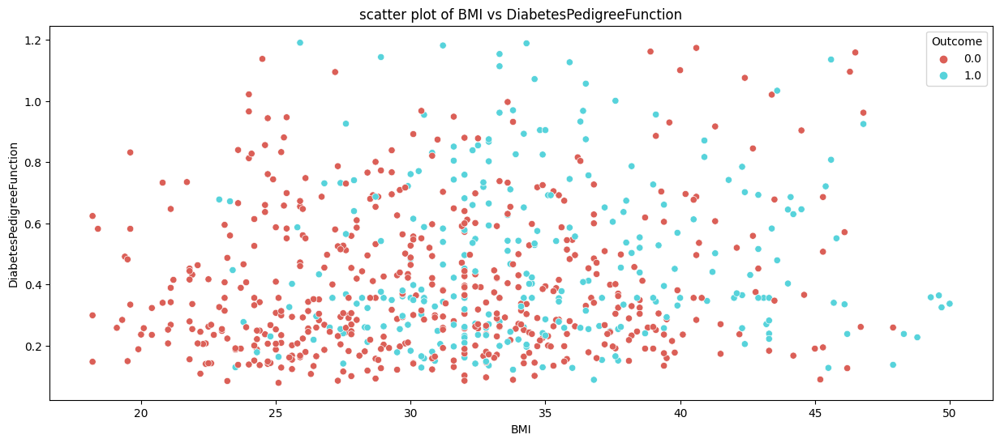

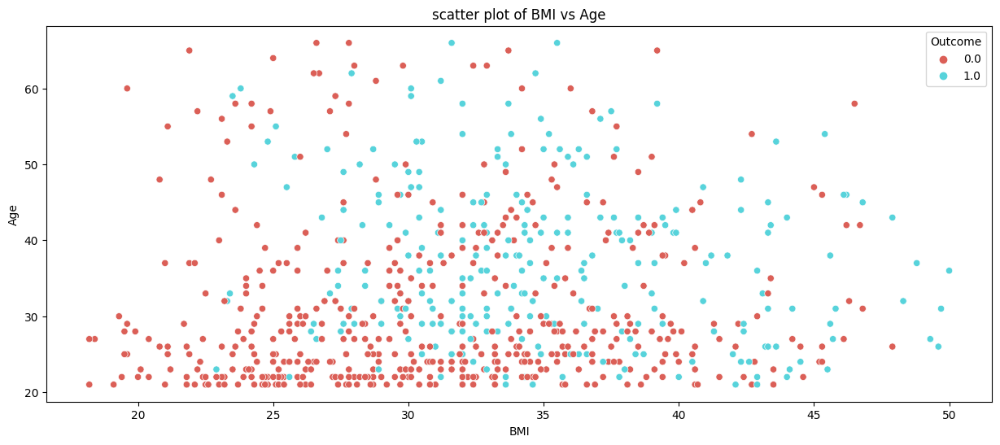

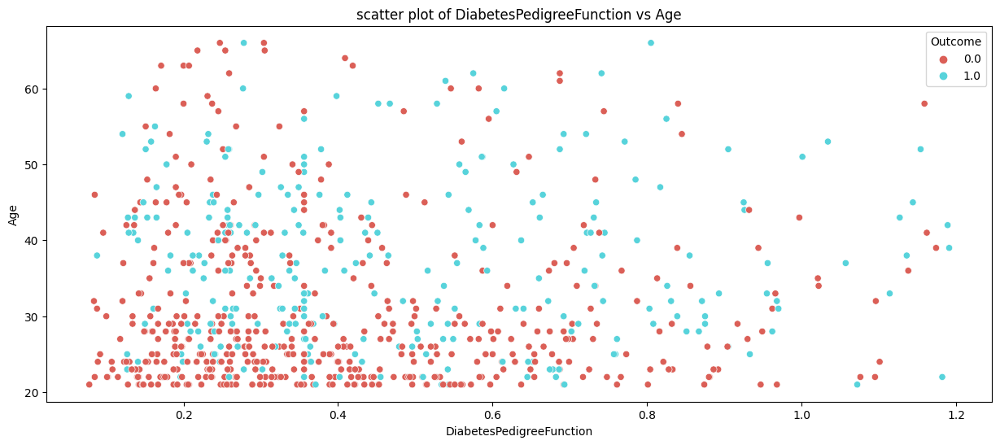

In [24]:

for i in range(len(continuous_features)):
    for j in range(i+1, len(continuous_features)):
        plt.figure(figsize=(15,6))
        sns.scatterplot(x=continuous_features[i], y=continuous_features[j], data=data, palette = 'hls', hue=data['Outcome'])
        plt.title(f'scatter plot of {continuous_features[i]} vs {continuous_features[j]}')
        plt.show()
        

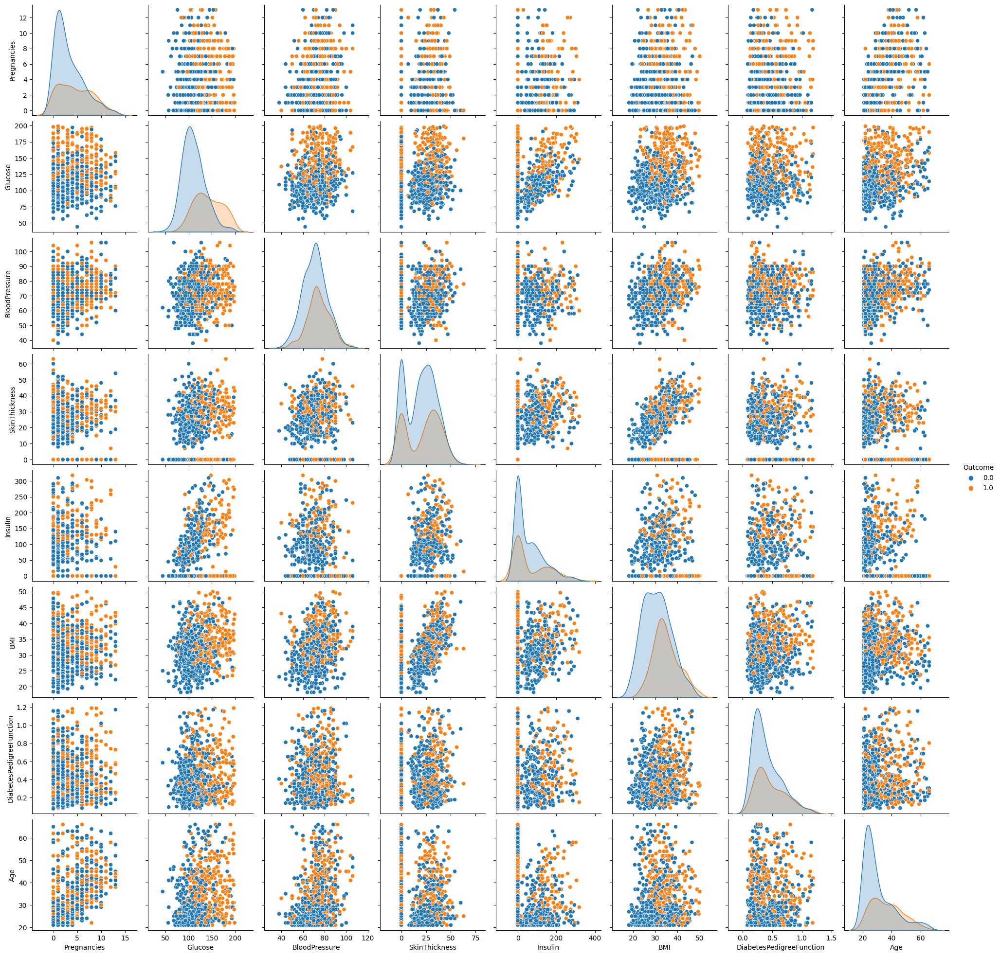

In [25]:

features = data.drop(columns=['Outcome'], axis=1)
sns.pairplot(data, hue='Outcome', vars=features)
plt.show()


In [26]:

correlation_matrix = data[continuous_features].corr()
correlation_matrix


,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
Pregnancies,1.000000,0.117692,0.208953,-0.096720,-0.108077,0.028339,0.004937,0.560768
Glucose,0.117692,1.000000,0.204539,0.060034,0.157277,0.228245,0.080436,0.274264
BloodPressure,0.208953,0.204539,1.000000,0.025645,-0.049508,0.271560,0.022533,0.326372
SkinThickness,-0.096720,0.060034,0.025645,1.000000,0.454830,0.373726,0.151583,-0.101397
Insulin,-0.108077,0.157277,-0.049508,0.454830,1.000000,0.163918,0.192998,-0.075614
BMI,0.028339,0.228245,0.271560,0.373726,0.163918,1.000000,0.123177,0.077668
DiabetesPedigreeFunction,0.004937,0.080436,0.022533,0.151583,0.192998,0.123177,1.000000,0.035872
Age,0.560768,0.274264,0.326372,-0.101397,-0.075614,0.077668,0.035872,1.000000


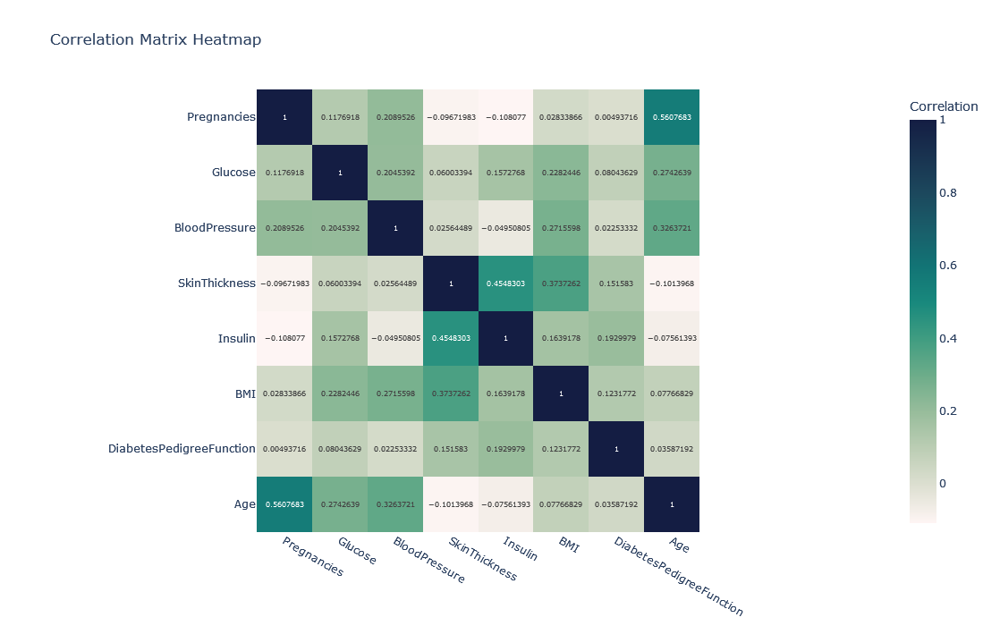

In [27]:

fig = px.imshow(correlation_matrix, 
                labels=dict(color="Correlation"),
                x=correlation_matrix.columns, 
                y=correlation_matrix.columns, color_continuous_scale='tempo',
                title="Correlation Matrix Heatmap",text_auto=True, width=1100, height=700)
fig.show()


In [28]:

threshold = 0.80 
highly_correlated_features = set()
for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > threshold:
            colname = correlation_matrix.columns[i]
            highly_correlated_features.add(colname)
            highly_correlated_features.add(correlation_matrix.columns[j])

print(f"Highly Correlated Features: {highly_correlated_features}")  


Highly Correlated Features: set()


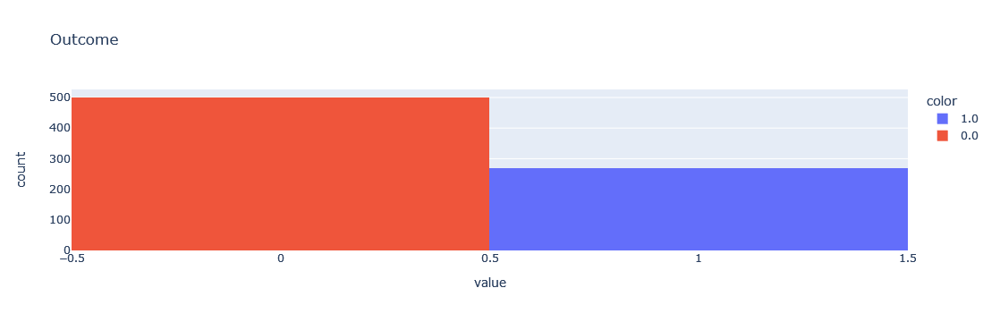

In [29]:

fig = px.histogram(data['Outcome'], title='Outcome', color=data['Outcome'])
fig.show()


In [30]:

x = data.drop(columns=['Outcome'], axis=1)
y = data['Outcome']

smote = SMOTE()
x_smote, y_smote = smote.fit_resample(x, y)


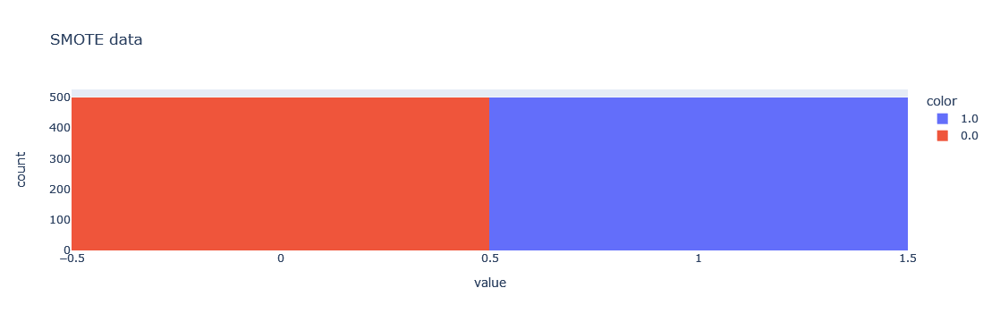

In [31]:

fig = px.histogram(y_smote, color=y_smote, title='SMOTE data')
fig.show()


## ***Logistic Regrassion Models***

### ***Base Model***

In [88]:

modelss = {
    'Random Forest Classifier':RandomForestClassifier(),
    'Decision Tree Regressor':DecisionTreeClassifier(),
    'Gradient Boosting Classifier':GradientBoostingClassifier(),
    'Logistic Regression':LogisticRegression(),
    'AdaBoostClassifier':AdaBoostClassifier(),
    'Suport Vector Classifier': SVC(),
    'XGBClassifier': XGBClassifier()
}


In [89]:

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']),
    ])
preprocessor


ColumnTransformer(transformers=[('num', StandardScaler(),
                                 ['Pregnancies', 'Glucose', 'BloodPressure',
                                  'SkinThickness', 'Insulin', 'BMI',
                                  'DiabetesPedigreeFunction', 'Age'])])

In [93]:

results = {}

for name, model in modelss.items():
    pipeline = Pipeline(steps = [('preprocessor', preprocessor),('model', model)])
    x_train, x_test, y_train, y_test = train_test_split(x_smote, y_smote, test_size=0.2, random_state=42)
    pipeline.fit(x_train, y_train)
    y_test_pred = pipeline.predict(x_test)
    y_train_pred = pipeline.predict(x_train)
    
    test_accuracy_score_ = accuracy_score(y_test_pred, y_test)
    train_accuracy_score_ = accuracy_score(y_train_pred, y_train)
    f1_score_ = f1_score(y_pred, y_test)
    recall_score_ = recall_score(y_pred, y_test)
    
    results[name] = {
        'Test Accuracy Score': f"{test_accuracy_score_:.2f}",
        'Train Accuracy Score': f"{train_accuracy_score_:.2f}" 
    }

results = pd.DataFrame(results).T
results

,Test Accuracy Score,Train Accuracy Score
Random Forest Classifier,0.79,1.00
Decision Tree Regressor,0.70,1.00
Gradient Boosting Classifier,0.72,0.92
Logistic Regression,0.70,0.77
AdaBoostClassifier,0.72,0.84
Suport Vector Classifier,0.79,0.86
XGBClassifier,0.77,1.00


## ***Hyperparameter Tuning***

In [94]:

param_grids = {
    'Random Forest Classifier': {'model__n_estimators': [1,2,3,4,5,6,7,8,9,10]},
    'Decision Tree Regressor': {'model__max_depth': [1,2,3,4,5,6,7,8,9,10,20,30]},
    'Gradient Boosting Classifier': {'model__n_estimators': [1,2,3,4,5,6,7,8,9,10,20.30]},
    'Logistic Regression': {'model__C': [0.001, 0.01, 0.1, 1.0, 10.0]},
    'Suport Vector Classifier': {'model__C': [0.001, 0.01, 0.1, 1.0, 10.0]},
    'XGBClassifier': {'model__learning_rate': [0.001, 0.01, 0.1, 1.0, 10.0]}
}


In [95]:

classifier_metrics = {'accuracy': accuracy_score, 'f1': f1_score, 'recall': recall_score}
regressor_metrics = {'mse': mean_squared_error}

results = {}
for name, model in modelss.items():
    pipeline = Pipeline(steps=[('preprocessor',preprocessor),('model', model)])
    param_grid = param_grids.get(name, {})
    grid_search = GridSearchCV(pipeline, param_grid, cv=5)
    x_train, x_test, y_train, y_test = train_test_split(x_smote, y_smote, test_size=0.2, random_state=42)
    grid_search.fit(x_train, y_train)
    best_model = grid_search.best_estimator_
    y_train_pred = best_model.predict(x_train)
    y_test_pred = best_model.predict(x_test)

    test_accuracy_score_ = accuracy_score(y_test_pred, y_test)
    train_accuracy_score_ = accuracy_score(y_train_pred, y_train)
    f1_score_ = f1_score(y_pred, y_test)
    recall_score_ = recall_score(y_pred, y_test)
    results[name] = {'Best Params': grid_search.best_params_, 'Test Accuracy Score': f"{test_accuracy_score_:.2f}",
                     'Train Accuracy Score': f"{train_accuracy_score_:.2f}",
                         'F1 Score': f"{f1_score_:0.2f}", 'Recall Score': f"{recall_score_:0.2f}"}

results_df = pd.DataFrame(results).T
display(results_df)


,Best Params,Test Accuracy Score,Train Accuracy Score,F1 Score,Recall Score
Random Forest Classifier,{'model__n_estimators': 9},0.78,0.99,0.80,0.78
Decision Tree Regressor,{'model__max_depth': 4},0.72,0.82,0.80,0.78
Gradient Boosting Classifier,{'model__n_estimators': 4},0.74,0.82,0.80,0.78
Logistic Regression,{'model__C': 10.0},0.70,0.77,0.80,0.78
AdaBoostClassifier,{},0.72,0.84,0.80,0.78
Suport Vector Classifier,{'model__C': 10.0},0.76,0.91,0.80,0.78
XGBClassifier,{'model__learning_rate': 0.1},0.74,1.00,0.80,0.78


## ***Best Model***

#### ***With Imbalanced Data***

In [132]:

preprocessor = ColumnTransformer( transformers = [
        ('num', StandardScaler(), ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']),
    ])

pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model',LogisticRegression(random_state=55)),
])

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

pipeline.fit(x_train,y_train)

y_test_pre = pipeline.predict(x_test)
y_train_pre = pipeline.predict(x_train)

test_accuracy_score_ = accuracy_score(y_test_pre, y_test)
train_accuracy_score_ = accuracy_score(y_train_pre, y_train)

print(f"test accuracy: {test_accuracy_score_ * 100:.2f}%")
print(f"train accuracy: {train_accuracy_score_ * 100:.2f}%")


test accuracy: 74.68%
train accuracy: 78.34%


***

#### ***With balanced Data***

In [130]:

preprocessor = ColumnTransformer( transformers = [
        ('num', StandardScaler(), ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']),
    ])

pipeline = Pipeline( steps = [
        ('preprocessor', preprocessor),
        ('model',LogisticRegression(random_state=25)),
    ])

x_train, x_test, y_train, y_test = train_test_split(x_smote, y_smote, test_size=0.2, random_state=42)

pipeline.fit(x_train, y_train)

y_test_pre = pipeline.predict(x_test)
y_train_pre = pipeline.predict(x_train)

test_accuracy_score_ = accuracy_score(y_test_pre, y_test)
train_accuracy_score_ = accuracy_score(y_train_pre, y_train)

print(f"test accuracy: {test_accuracy_score_ * 100:.2f}%")
print(f"train accuracy: {train_accuracy_score_ * 100:.2f}%")


test accuracy: 70.00%
train accuracy: 77.12%
